In [4]:
library(ggplot2)
library(gridExtra)
library(reshape)
library(repr)
library(plotly)
library(maps)
library(tidyr)
library(dplyr)

options(repr.plot.width=16, repr.plot.height=8)
read.tcsv = function(file, header=TRUE, sep=",", ...) {
  
  n = max(count.fields(file, sep=sep), na.rm=TRUE)
  x = readLines(file)
  
  .splitvar = function(x, sep, n) {
    var = unlist(strsplit(x, split=sep))
    length(var) = n
    return(var)
  }
  
  x = do.call(cbind, lapply(x, .splitvar, sep=sep, n=n))
  x = apply(x, 1, paste, collapse=sep) 
  ## empty strings are converted to NA
  out = read.csv(text=x, sep=sep, header=header, na.strings = "", ...)
  return(out)
  
}


Attaching package: ‘tidyr’


The following objects are masked from ‘package:reshape’:

    expand, smiths




# Air Travel

In [2]:
airTravel <- read.tcsv("./data/air_travel_passengers_usafacts.csv")
airTravel <- airTravel[,c(1,2,3)] # remove extra notes in data file
names(airTravel) <- c("date","raw","avg")
airMelt <- melt(airTravel,id=c("date"))
head(airTravel)
head(airMelt)

,date,raw,avg
,<fct>,<int>,<dbl>
1,2020-03-01,2280522,0
2,2020-03-02,2089641,0
3,2020-03-03,1736393,0
4,2020-03-04,1877401,0
5,2020-03-05,2130015,0
6,2020-03-06,2198517,0


,date,variable,value
,<fct>,<fct>,<dbl>
1,2020-03-01,raw,2280522
2,2020-03-02,raw,2089641
3,2020-03-03,raw,1736393
4,2020-03-04,raw,1877401
5,2020-03-05,raw,2130015
6,2020-03-06,raw,2198517


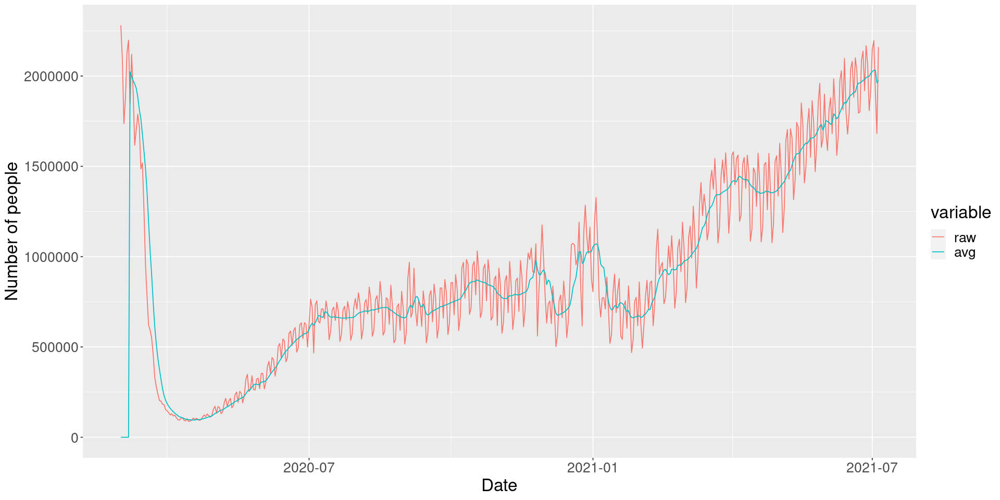

In [3]:
ggplot(data=airMelt)+geom_line(aes(x=as.Date(date),y=value, color=variable))+
    xlab("Date")+
    ylab("Number of people")+
    theme(text=element_text(size=20))
    

# Retail Sales Data

In [4]:
retailSales <- read.tcsv("./data/retail_sales_usafacts.csv")
retailSales <- retailSales[,c(1,2,4,5,6,7,8,9,10,11)] # remove extra notes in data file
names(retailSales) <- c("date","total","gas","care","vehicles","groceries","clothing","other","building","merchandise")
retailSales$date = as.Date(paste0(retailSales$date, "-01"), "%b-%Y-%d") # data is monthly
retailMelt <- melt(retailSales,id=c("date"))
retailMelt$value <- retailMelt$value/1000000000
head(retailSales)
head(retailMelt)

,date,total,gas,care,vehicles,groceries,clothing,other,building,merchandise
,<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,2020-01-01,5.26930e+11,4.3195e+10,2.8872e+10,1.05162e+11,6.5321e+10,2.2914e+10,1.67952e+11,3.2920e+10,6.0594e+10
2,2020-02-01,5.25810e+11,4.1625e+10,2.9064e+10,1.05520e+11,6.5326e+10,2.2560e+10,1.68112e+11,3.2904e+10,6.0699e+10
3,2020-03-01,4.80407e+11,3.4677e+10,3.0492e+10,7.80460e+10,8.2743e+10,1.1494e+10,1.44435e+11,3.2810e+10,6.5710e+10
4,2020-04-01,4.09819e+11,2.6131e+10,2.5958e+10,6.81980e+10,7.2048e+10,2.8360e+09,1.25375e+11,3.2184e+10,5.7089e+10
5,2020-05-01,4.83980e+11,2.9480e+10,2.6251e+10,1.00855e+11,7.3714e+10,8.4070e+09,1.48052e+11,3.6149e+10,6.1072e+10
6,2020-06-01,5.26860e+11,3.4258e+10,2.8336e+10,1.10574e+11,7.2538e+10,1.7712e+10,1.64855e+11,3.6538e+10,6.2049e+10


,date,variable,value
,<date>,<fct>,<dbl>
1,2020-01-01,total,526.930
2,2020-02-01,total,525.810
3,2020-03-01,total,480.407
4,2020-04-01,total,409.819
5,2020-05-01,total,483.980
6,2020-06-01,total,526.860


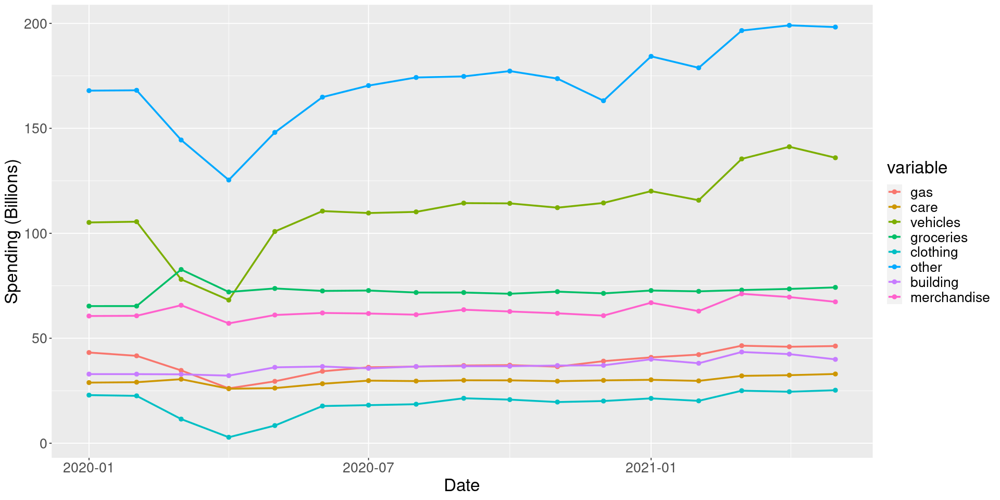

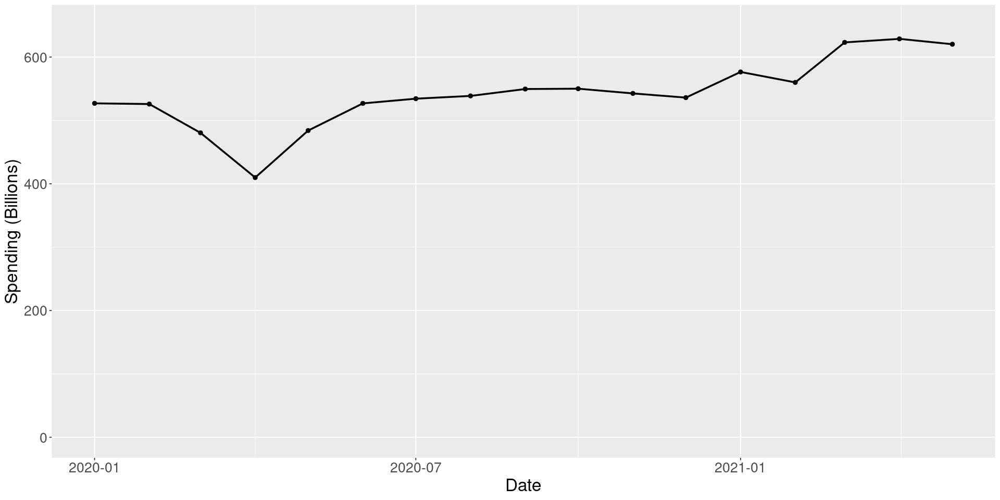

In [5]:
plot <- ggplot(data=retailMelt[retailMelt$variable!="total",],aes(x=date,y=value,color=variable))+
    geom_line(size=1)+
    geom_point(size=2)+
    xlab("Date")+
    ylab("Spending (Billions)")+
    theme(text = element_text(size=20)) 

totalPlot <- ggplot(data=retailMelt[retailMelt$variable=="total",],aes(x=date,y=value))+
    geom_line(size=1)+
    geom_point(size=2)+
    xlab("Date")+
    ylab("Spending (Billions)")+
    ylim(0,650)+
    theme(text = element_text(size=20)) 
show(plot)
show(totalPlot)

# Savings Rate
% of disposable income saved

In [6]:
savings <- read.tcsv("./data/saving_rate_usafacts.csv")
savings <- savings[,c(1,2)] # remove extra notes in data file
names(savings) <- c("date","rate")
savings$date = as.Date(paste0(savings$date, "-01"), "%b-%Y-%d") # data is monthly
head(savings)

,date,rate
,<date>,<dbl>
1,2020-01-01,0.076
2,2020-02-01,0.083
3,2020-03-01,0.129
4,2020-04-01,0.337
5,2020-05-01,0.247
6,2020-06-01,0.190


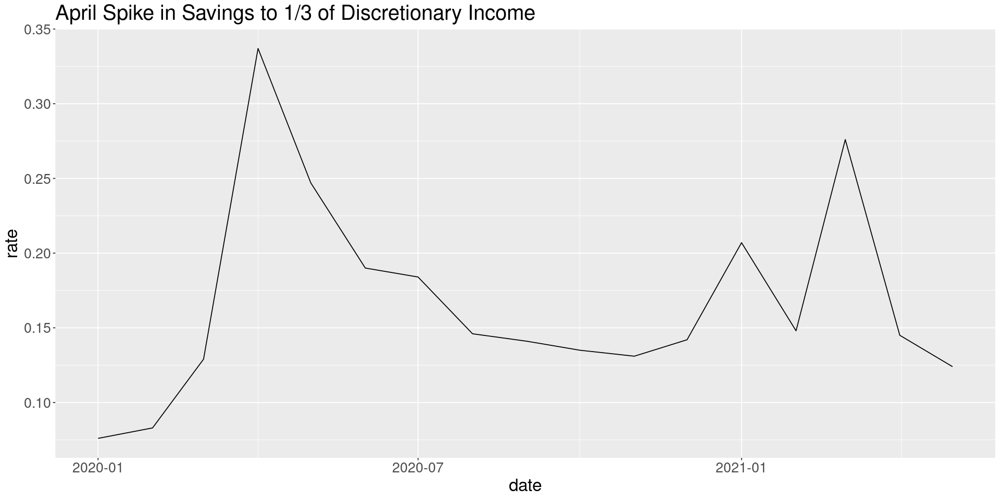

In [7]:
savingPlot <- ggplot(data=savings,aes(x=date,y=rate))+
    geom_line()+
    ggtitle("April Spike in Savings to 1/3 of Discretionary Income")+
    theme(text = element_text(size=20)) 
show(savingPlot)

## Comparing saving and spending

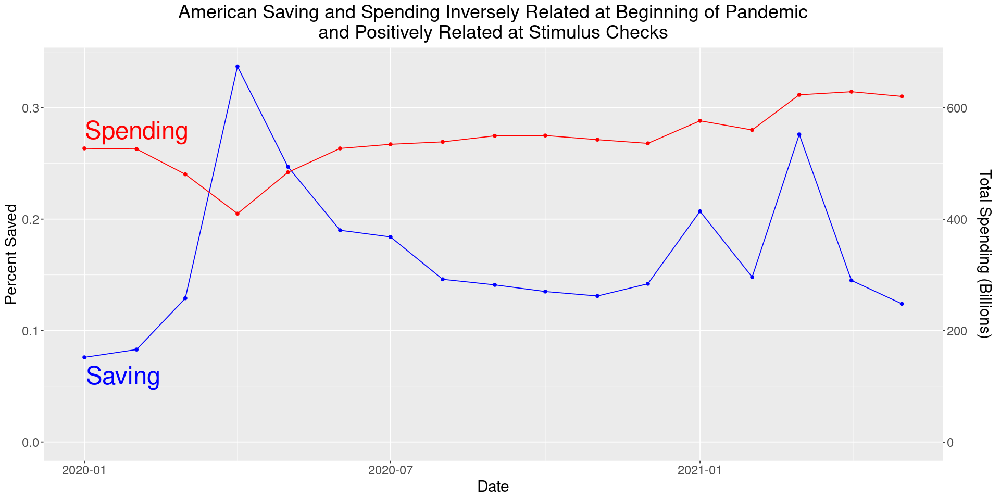

In [8]:
coeff <- 2000
saveSpendingPlot <- ggplot()+
    geom_line(aes(x=savings$date,y=savings$rate), color="blue")+
    geom_point(aes(x=savings$date,y=savings$rate), color="blue")+
    geom_line(aes(x=retailMelt[retailMelt$variable=="total",]$date,y=retailMelt[retailMelt$variable=="total",]$value/coeff),color="red")+
    geom_point(aes(x=retailMelt[retailMelt$variable=="total",]$date,y=retailMelt[retailMelt$variable=="total",]$value/coeff),color="red")+
    ggtitle("American Saving and Spending Inversely Related at Beginning of Pandemic\nand Positively Related at Stimulus Checks")+
    xlab("Date")+
    theme(text = element_text(size=18),
            plot.title = element_text(hjust = 0.5),
         axis.title.y.right = element_text(margin = margin(t = 0, r = 0, b = 0, l = 15)))+
    scale_y_continuous(
        # Features of the first axis
        name = "Percent Saved",

        # Add a second axis and specify its features
        sec.axis = sec_axis(~.*coeff, name="Total Spending (Billions)")
      )+
    expand_limits(y=0)+
    annotate("text", x=as.Date("2020-01-24"),y=0.06,label="Saving", size=10, color="blue")+
    annotate("text", x=as.Date("2020-02-1"),y=0.28,label="Spending", size=10,color="red")
show(saveSpendingPlot)

# Government Spending

In [9]:
govSpending <- read.tcsv("./data/federal_government_spending_usafacts.csv")
govSpending <- govSpending[,c(1,2,4,5,6,7,8,9,10,11)] # remove extra notes in data file
names(govSpending) <- c("date","total","military","health","unemployement","irs","treasury","smallBusiness","other","socialSecurity")
govSpending$date = as.Date(paste0(govSpending$date, "-01"), "%b-%Y-%d") # data is monthly
govMelt <- melt(govSpending,id=c("date"))
govMelt$value <- govMelt$value/1000000000
head(govSpending)
head(govMelt)

,date,total,military,health,unemployement,irs,treasury,smallBusiness,other,socialSecurity
,<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,2019-10-01,26805053349,4847257614,8225823327,53749837,2538870080,-1062773700,-18575651,7191172036,5029529806
2,2019-11-01,23160023981,2977198953,11473592288,-79396595,262105949,155897031,-29690121,2837607826,5562708650
3,2019-12-01,22954561914,7596867697,613647188,277387371,1782039635,4254406220,-26654885,4035641823,4421226865
4,2020-01-01,73584011745,3525605810,38333358876,-196867221,997030045,6241610284,-4914060,15889507372,8798680639
5,2020-02-01,22043036519,1253421790,3824314688,74595304,3587822383,6826609501,-10503212,2419633757,4067142308
6,2020-03-01,-19864599893,2459548983,-26698854899,2797790435,-5456870524,5172238496,-416691696,2457084631,-178845320


,date,variable,value
,<date>,<fct>,<dbl>
1,2019-10-01,total,26.80505
2,2019-11-01,total,23.16002
3,2019-12-01,total,22.95456
4,2020-01-01,total,73.58401
5,2020-02-01,total,22.04304
6,2020-03-01,total,-19.86460


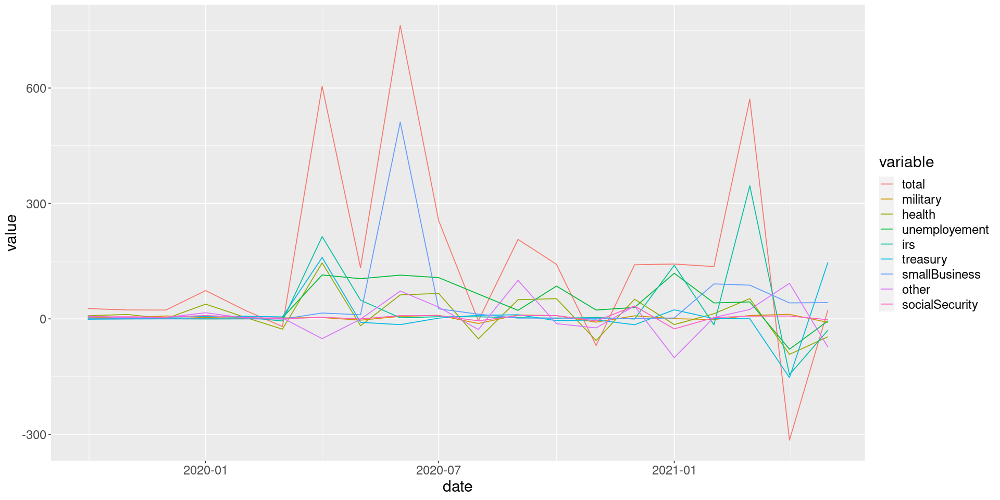

In [10]:
govPlot <- ggplot(data=govMelt)+geom_line(aes(x=date,y=value,color=variable))+
    theme(text = element_text(size=18))

show(govPlot)

# Unemployement Data

In [11]:
unemploymentRate <- read.tcsv("./data/unemployment_rate_usafacts.csv")
unemploymentRate <- unemploymentRate[,c(1,2,4,5,6,7)] # remove extra notes in data file
names(unemploymentRate) <- c("date","rate","white","black","asian","hispanic")
unemploymentRate$date = as.Date(paste0(unemploymentRate$date, "-01"), "%b-%Y-%d") # data is monthly
unemploymentMelt <- melt(unemploymentRate, id="date")
head(unemploymentRate)
head(unemploymentMelt)

unemploymentClaims <- read.tcsv("./data/unemployment_claims_ongoing_usafacts.csv")
unemploymentClaims <- unemploymentClaims[,c(1,2)] # remove extra notes in data file
names(unemploymentClaims) <- c("date","claims")
unemploymentClaims$date = as.Date(unemploymentClaims$date, "%Y-%m-%d") # data is monthly
unemploymentClaims$claims = unemploymentClaims$claims/1000000
head(unemploymentClaims)

,date,rate,white,black,asian,hispanic
,<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,2018-01-01,0.040,0.035,0.081,0.032,0.058
2,2018-02-01,0.041,0.037,0.071,0.031,0.053
3,2018-03-01,0.040,0.033,0.068,0.029,0.052
4,2018-04-01,0.040,0.030,0.061,0.027,0.043
5,2018-05-01,0.038,0.030,0.056,0.020,0.044
6,2018-06-01,0.040,0.036,0.066,0.033,0.046


,date,variable,value
,<date>,<fct>,<dbl>
1,2018-01-01,rate,0.040
2,2018-02-01,rate,0.041
3,2018-03-01,rate,0.040
4,2018-04-01,rate,0.040
5,2018-05-01,rate,0.038
6,2018-06-01,rate,0.040


,date,claims
,<date>,<dbl>
1,2020-01-04,1.766
2,2020-01-11,1.739
3,2020-01-18,1.709
4,2020-01-25,1.752
5,2020-02-01,1.698
6,2020-02-08,1.734


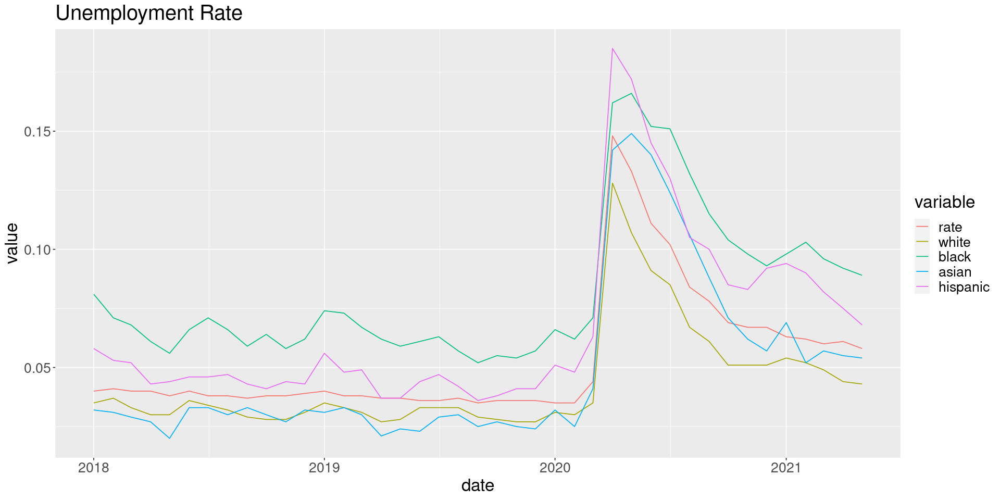

In [12]:
ggplot(data=unemploymentMelt)+
    geom_line(aes(x=date,y=value,color=variable))+
    ggtitle("Unemployment Rate")+
    theme(text = element_text(size=20))

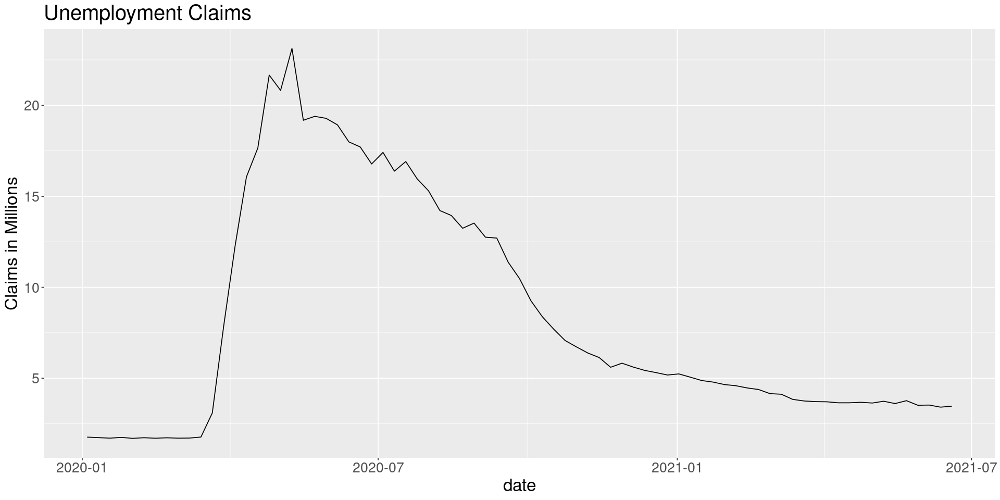

In [13]:
ggplot(data=unemploymentClaims)+geom_line(aes(x=date,y=claims))+
    ggtitle("Unemployment Claims")+
    ylab("Claims in Millions")+
    theme(text = element_text(size=20))

# COVID County Data

In [57]:
covidCounty <- read.csv("./data/covid_confirmed_usafacts.csv")
head(covidCounty)
covidCountyMelt <- melt(covidCounty, id=c("countyFIPS","CountyName","State","StateFIPS"))
names(covidCountyMelt) <- c("countyFIPS","CountyName","State","StateFIPS","date","count")
covidCountyMelt$date <- gsub("X","",as.character(covidCountyMelt$date))
covidCountyMelt$date <- as.Date(covidCountyMelt$date, format="%Y.%m.%d")
head(covidCountyMelt)

states <- map_data("state")
head(states)

,countyFIPS,CountyName,State,StateFIPS,X2020.01.22,X2020.01.23,X2020.01.24,X2020.01.25,X2020.01.26,X2020.01.27,⋯,X2021.06.22,X2021.06.23,X2021.06.24,X2021.06.25,X2021.06.26,X2021.06.27,X2021.06.28,X2021.06.29,X2021.06.30,X2021.07.01
,<int>,<fct>,<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,0,Statewide Unallocated,AL,1,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
2,1001,Autauga County,AL,1,0,0,0,0,0,0,⋯,7242,7244,7244,7244,7244,7244,7247,7247,7257,7257
3,1003,Baldwin County,AL,1,0,0,0,0,0,0,⋯,21901,21921,21921,21945,21945,21945,21985,21985,22027,22027
4,1005,Barbour County,AL,1,0,0,0,0,0,0,⋯,2345,2344,2344,2344,2344,2344,2345,2345,2346,2346
5,1007,Bibb County,AL,1,0,0,0,0,0,0,⋯,2685,2686,2686,2686,2686,2686,2687,2687,2693,2693
6,1009,Blount County,AL,1,0,0,0,0,0,0,⋯,6950,6957,6957,6967,6967,6967,6975,6975,6987,6987


,countyFIPS,CountyName,State,StateFIPS,date,count
,<int>,<fct>,<fct>,<int>,<date>,<int>
1,0,Statewide Unallocated,AL,1,2020-01-22,0
2,1001,Autauga County,AL,1,2020-01-22,0
3,1003,Baldwin County,AL,1,2020-01-22,0
4,1005,Barbour County,AL,1,2020-01-22,0
5,1007,Bibb County,AL,1,2020-01-22,0
6,1009,Blount County,AL,1,2020-01-22,0


,long,lat,group,order,region,subregion
,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
1,-87.46201,30.38968,1,1,alabama,NA
2,-87.48493,30.37249,1,2,alabama,NA
3,-87.52503,30.37249,1,3,alabama,NA
4,-87.53076,30.33239,1,4,alabama,NA
5,-87.57087,30.32665,1,5,alabama,NA
6,-87.58806,30.32665,1,6,alabama,NA


In [15]:
plot <- ggplot(data=covidCountyMelt[covidCountyMelt$State=="OH",])+geom_line(aes(x=date,y=count,color=CountyName))
embed_notebook(ggplotly(plot), height="500")

<iframe src="data:text/html;charset=utf-8;base64,PCFET0NUWVBFIGh0bWw+CjxodG1sPgo8aGVhZD4KPG1ldGEgY2hhcnNldD0idXRmLTgiIC8+Cjx0aXRsZT5wbG90bHk8L3RpdGxlPgo8c2NyaXB0PihmdW5jdGlvbigpIHsKICAvLyBJZiB3aW5kb3cuSFRNTFdpZGdldHMgaXMgYWxyZWFkeSBkZWZpbmVkLCB0aGVuIHVzZSBpdDsgb3RoZXJ3aXNlIGNyZWF0ZSBhCiAgLy8gbmV3IG9iamVjdC4gVGhpcyBhbGxvd3MgcHJlY2VkaW5nIGNvZGUgdG8gc2V0IG9wdGlvbnMgdGhhdCBhZmZlY3QgdGhlCiAgLy8gaW5pdGlhbGl6YXRpb24gcHJvY2VzcyAodGhvdWdoIG5vbmUgY3VycmVudGx5IGV4aXN0KS4KICB3aW5kb3cuSFRNTFdpZGdldHMgPSB3aW5kb3cuSFRNTFdpZGdldHMgfHwge307CgogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIGEgdmlld2VyIHBhbmUuIElmIG5vdCwgd2UncmUgaW4gYSB3ZWIgYnJvd3Nlci4KICB2YXIgdmlld2VyTW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy52aWV3ZXJNb2RlID0KICAgICAgL1xidmlld2VyX3BhbmU9MVxiLy50ZXN0KHdpbmRvdy5sb2NhdGlvbik7CgogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIFNoaW55IG1vZGUuIElmIG5vdCwgaXQncyBhIHN0YXRpYyBkb2N1bWVudC4KICAvLyBOb3RlIHRoYXQgc3RhdGljIHdpZGdldHMgY2FuIGFwcGVhciBpbiBib3RoIFNoaW55IGFuZCBzdGF0aWMgbW9kZXMsIGJ1dAogIC8vIG9idmlvdXNseSwgU2hpbnkgd2lkZ2V0cyBjYW4gb25seSBhcHBlYXIgaW4gU2hpbnkgYXBwcy9kb2N1bWVudHMuCiAgdmFyIHNoaW55TW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy5zaGlueU1vZGUgPQogICAgICB0eXBlb2Yod2luZG93LlNoaW55KSAhPT0gInVuZGVmaW5lZCIgJiYgISF3aW5kb3cuU2hpbnkub3V0cHV0QmluZGluZ3M7CgogIC8vIFdlIGNhbid0IGNvdW50IG9uIGpRdWVyeSBiZWluZyBhdmFpbGFibGUsIHNvIHdlIGltcGxlbWVudCBvdXIgb3duCiAgLy8gdmVyc2lvbiBpZiBuZWNlc3NhcnkuCiAgZnVuY3Rpb24gcXVlcnlTZWxlY3RvckFsbChzY29wZSwgc2VsZWN0b3IpIHsKICAgIGlmICh0eXBlb2YoalF1ZXJ5KSAhPT0gInVuZGVmaW5lZCIgJiYgc2NvcGUgaW5zdGFuY2VvZiBqUXVlcnkpIHsKICAgICAgcmV0dXJuIHNjb3BlLmZpbmQoc2VsZWN0b3IpOwogICAgfQogICAgaWYgKHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwpIHsKICAgICAgcmV0dXJuIHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwoc2VsZWN0b3IpOwogICAgfQogIH0KCiAgZnVuY3Rpb24gYXNBcnJheSh2YWx1ZSkgewogICAgaWYgKHZhbHVlID09PSBudWxsKQogICAgICByZXR1cm4gW107CiAgICBpZiAoJC5pc0FycmF5KHZhbHVlKSkKICAgICAgcmV0dXJuIHZhbHVlOwogICAgcmV0dXJuIFt2YWx1ZV07CiAgfQoKICAvLyBJbXBsZW1lbnQgalF1ZXJ5J3MgZXh0ZW5kCiAgZnVuY3Rpb24gZXh0ZW5kKHRhcmdldCAvKiwgLi4uICovKSB7CiAgICBpZiAoYXJndW1lbnRzLmxlbmd0aCA9PSAxKSB7CiAgICAgIHJldHVybiB0YXJnZXQ7CiAgICB9CiAgICBmb3IgKHZhciBpID0gMTsgaSA8IGFyZ3VtZW50cy5sZW5ndGg7IGkrKykgewogICAgICB2YXIgc291cmNlID0gYXJndW1lbnRzW2ldOwogICAgICBmb3IgKHZhciBwcm9wIGluIHNvdXJjZSkgewogICAgICAgIGlmIChzb3VyY2UuaGFzT3duUHJvcGVydHkocHJvcCkpIHsKICAgICAgICAgIHRhcmdldFtwcm9wXSA9IHNvdXJjZVtwcm9wXTsKICAgICAgICB9CiAgICAgIH0KICAgIH0KICAgIHJldHVybiB0YXJnZXQ7CiAgfQoKICAvLyBJRTggZG9lc24ndCBzdXBwb3J0IEFycmF5LmZvckVhY2guCiAgZnVuY3Rpb24gZm9yRWFjaCh2YWx1ZXMsIGNhbGxiYWNrLCB0aGlzQXJnKSB7CiAgICBpZiAodmFsdWVzLmZvckVhY2gpIHsKICAgICAgdmFsdWVzLmZvckVhY2goY2FsbGJhY2ssIHRoaXNBcmcpOwogICAgfSBlbHNlIHsKICAgICAgZm9yICh2YXIgaSA9IDA7IGkgPCB2YWx1ZXMubGVuZ3RoOyBpKyspIHsKICAgICAgICBjYWxsYmFjay5jYWxsKHRoaXNBcmcsIHZhbHVlc1tpXSwgaSwgdmFsdWVzKTsKICAgICAgfQogICAgfQogIH0KCiAgLy8gUmVwbGFjZXMgdGhlIHNwZWNpZmllZCBtZXRob2Qgd2l0aCB0aGUgcmV0dXJuIHZhbHVlIG9mIGZ1bmNTb3VyY2UuCiAgLy8KICAvLyBOb3RlIHRoYXQgZnVuY1NvdXJjZSBzaG91bGQgbm90IEJFIHRoZSBuZXcgbWV0aG9kLCBpdCBzaG91bGQgYmUgYSBmdW5jdGlvbgogIC8vIHRoYXQgUkVUVVJOUyB0aGUgbmV3IG1ldGhvZC4gZnVuY1NvdXJjZSByZWNlaXZlcyBhIHNpbmdsZSBhcmd1bWVudCB0aGF0IGlzCiAgLy8gdGhlIG92ZXJyaWRkZW4gbWV0aG9kLCBpdCBjYW4gYmUgY2FsbGVkIGZyb20gdGhlIG5ldyBtZXRob2QuIFRoZSBvdmVycmlkZGVuCiAgLy8gbWV0aG9kIGNhbiBiZSBjYWxsZWQgbGlrZSBhIHJlZ3VsYXIgZnVuY3Rpb24sIGl0IGhhcyB0aGUgdGFyZ2V0IHBlcm1hbmVudGx5CiAgLy8gYm91bmQgdG8gaXQgc28gInRoaXMiIHdpbGwgd29yayBjb3JyZWN0bHkuCiAgZnVuY3Rpb24gb3ZlcnJpZGVNZXRob2QodGFyZ2V0LCBtZXRob2ROYW1lLCBmdW5jU291cmNlKSB7CiAgICB2YXIgc3VwZXJGdW5jID0gdGFyZ2V0W21ldGhvZE5hbWVdIHx8IGZ1bmN0aW9uKCkge307CiAgICB2YXIgc3VwZXJGdW5jQm91bmQgPSBmdW5jdGlvbigpIHsKICAgICAgcmV0dXJuIHN1cGVyRnVuYy5hcHBseSh0YXJnZXQsIGFyZ3VtZW50cyk7CiAgICB9OwogICAgdGFyZ2V0W21ldGhvZE5hbWVdID0gZnVuY1NvdXJjZShzdXBlckZ1bmNCb3VuZCk7CiAgfQoKICAvLyBBZGQgYSBtZXRob2QgdG8gZGVsZWdhdG9yIHRoYXQsIHdoZW4gaW52b2tlZCwgY2FsbHMKICAvLyBkZWxlZ2F0ZWUubWV0aG9kTmFtZS4gSWYgdGhlcmUgaXMgbm8gc3VjaCBtZXRob2Qgb24KICAvLyB0aGUgZGVsZWdhdGVlLCBidXQgdGhlcmUgd2FzIG9uZSBvbiBkZWxlZ2F0b3IgYmVmb3JlCiAgLy8gZGVsZWdhdGVNZXRob2Qgd2FzIGNhbGxlZCwgdGhlbiB

In [58]:
gcounty <- map_data("county")
# head(gcounty)

# note we will need to clean up the weird sub region data in the fips data
# head(filter(county.fips, grepl(":", polyname)))

# which we can clean with the following code
fipstab <- transmute(county.fips, fips, county = sub(":.*", "", polyname))
fipstab <- unique(fipstab)
fipstab <- separate(fipstab, county, c("region", "subregion"), sep = ",")

# finally we can rejoin it with the longitude/latitude data with the fips data
gcounty <- left_join(gcounty, fipstab, c("region", "subregion"))
head(gcounty)

head(covidCountyMeltReduced)
covidCountyMeltReduced <- covidCountyMelt[covidCountyMelt$countyFIPS>1000,]
names(covidCountyMeltReduced) <- c("fips","CountyName","State","StateFIPS","date","count")
covidCountyMeltReduced <- left_join(covidCountyMeltReduced, gcounty, c("fips"))
head(covidCountyMeltReduced)

,long,lat,group,order,region,subregion,fips
,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<int>
1,-86.50517,32.34920,1,1,alabama,autauga,1001
2,-86.53382,32.35493,1,2,alabama,autauga,1001
3,-86.54527,32.36639,1,3,alabama,autauga,1001
4,-86.55673,32.37785,1,4,alabama,autauga,1001
5,-86.57966,32.38357,1,5,alabama,autauga,1001
6,-86.59111,32.37785,1,6,alabama,autauga,1001


,fips,CountyName,State,StateFIPS,date,count,long,lat,group,order,region,subregion
,<int>,<fct>,<fct>,<int>,<date>,<int>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
1,1001,Autauga County,AL,1,2020-01-22,0,-86.50517,32.34920,1,1,alabama,autauga
2,1001,Autauga County,AL,1,2020-01-22,0,-86.53382,32.35493,1,2,alabama,autauga
3,1001,Autauga County,AL,1,2020-01-22,0,-86.54527,32.36639,1,3,alabama,autauga
4,1001,Autauga County,AL,1,2020-01-22,0,-86.55673,32.37785,1,4,alabama,autauga
5,1001,Autauga County,AL,1,2020-01-22,0,-86.57966,32.38357,1,5,alabama,autauga
6,1001,Autauga County,AL,1,2020-01-22,0,-86.59111,32.37785,1,6,alabama,autauga


,fips,CountyName,State,StateFIPS,date,count,long,lat,group,order,region,subregion
,<int>,<fct>,<fct>,<int>,<date>,<int>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
1,1001,Autauga County,AL,1,2020-01-22,0,-86.50517,32.34920,1,1,alabama,autauga
2,1001,Autauga County,AL,1,2020-01-22,0,-86.53382,32.35493,1,2,alabama,autauga
3,1001,Autauga County,AL,1,2020-01-22,0,-86.54527,32.36639,1,3,alabama,autauga
4,1001,Autauga County,AL,1,2020-01-22,0,-86.55673,32.37785,1,4,alabama,autauga
5,1001,Autauga County,AL,1,2020-01-22,0,-86.57966,32.38357,1,5,alabama,autauga
6,1001,Autauga County,AL,1,2020-01-22,0,-86.59111,32.37785,1,6,alabama,autauga


Warning message:
“Transformation introduced infinite values in discrete y-axis”


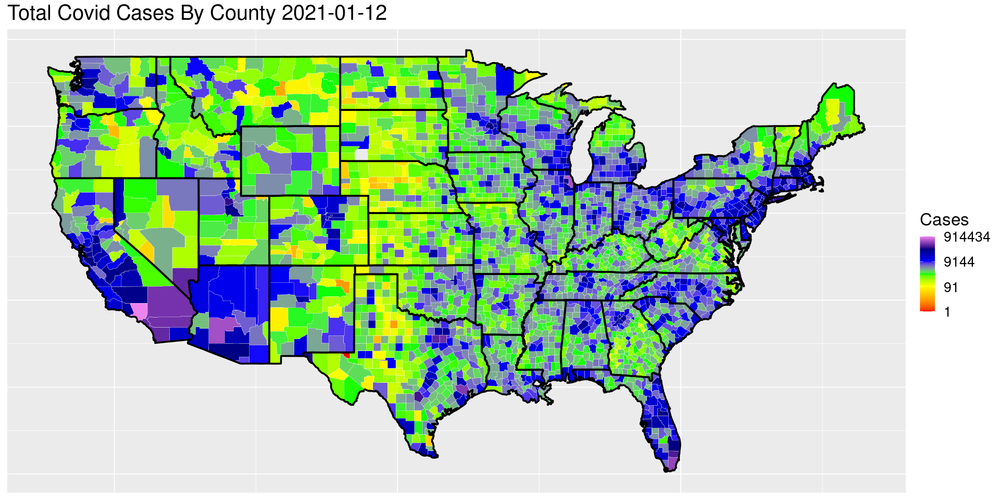

In [62]:
plotDate <- as.Date("2021-01-12")
#nrow(covidCountyMeltReduced[covidCountyMeltReduced$date==as.Date("2021-01-12") & covidCountyMeltReduced$State=="OH",])
max_break <- max(covidCountyMeltReduced[covidCountyMeltReduced$date==plotDate,]$count)
my_breaks <- c(1,round(max_break/10000),round(max_break/100),max_break)
mycol <- c("red", "orange", "yellow", "green", "blue", "navy", "violet")
ggplot(covidCountyMeltReduced[covidCountyMeltReduced$date==plotDate,]) +
    geom_polygon(aes(long, lat, group = group, fill = count),
                 color = "white", size = 0.1)+
    geom_polygon(data = states, aes(long, lat, group = group),
                 fill = NA, color = "black", size=1)+
    scale_fill_gradientn(name = "Cases", trans = "log",
                        breaks = my_breaks, labels = my_breaks, colours=mycol)+
    ggtitle(paste("Total Covid Cases By County ", plotDate, sep=""))+
    theme(text = element_text(size=20),
        axis.title.x=element_blank(),
        axis.text.x=element_blank(),
        axis.ticks.x=element_blank(),
        axis.title.y=element_blank(),
        axis.text.y=element_blank(),
        axis.ticks.y=element_blank())